# Tohoku Okada KL Notebook

## Setup Environment

We assume you have installed `anuga` in your `python` environment. 

### Setup inline graphics and animation

In [1]:
import os
import anuga
import numpy as np
import matplotlib.pyplot as plt
import okada_kl_subfaults as okl
#from google.colab import files

%matplotlib inline

# Allow inline jshtml animations
from matplotlib import rc
rc('animation', html='jshtml')

## Tohoku Folder

Change into the Tohoku folder (if you have not done that already)

In [2]:
print(f'Current directory {os.getcwd()}')
try:
    os.chdir('Tohoku')
except:
    pass


Current directory /home/steve/Tohoku


## Setup Anuga Model

### Project parameters

In [3]:
import project


Area of bounding polygon = 501600.00 km^2
Number of triangles: 82693
output directory: /home/steve/Tohoku/_output_Fujii
source directory: /home/steve/Tohoku/sources/Fujii.pts


project name:  Tohoku
Number of triangles =  87484
The extent is  (0.0, 880000.0, 0.0, 570000.0)
Geo reference is  (zone=54, easting=420000.000000, northing=3950000.000000, hemisphere=northern)
Figure files for each frame will be stored in _plot


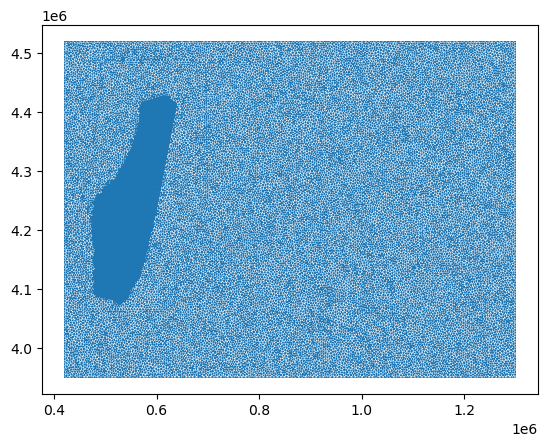

In [17]:
print ('project name: ', project.name_stem)
domain = anuga.create_domain_from_regions(project.bounding_polygon,
                                        boundary_tags={'bottom': [0],
                                                       'ocean_east': [1],
                                                       'top': [2],
                                                       'onshore': [3]},
                                        maximum_triangle_area=project.res_whole,
                                        mesh_filename=project.meshname,
                                        interior_regions=project.interior_regions,
                                        use_cache=False,
                                        verbose=False)



domain.set_hemisphere('northern')
domain.set_zone(54)
print ('Number of triangles = ', len(domain))
print ('The extent is ', domain.get_extent())
print ('Geo reference is ',domain.geo_reference)

domain.set_quantity('elevation',
                        filename=project.name_stem + '.pts',
                        use_cache=True,
                        verbose=False,
                        alpha=0.1)


tide = -0.45
domain.set_quantity('stage', tide)


Elevation = domain.quantities['elevation'].centroid_values
Stage     = domain.quantities['stage'].centroid_values

Stage[:] = np.maximum(Elevation, Stage)
                        

dplotter = anuga.Domain_plotter(domain, absolute=True)
plt.triplot(dplotter.triang, linewidth = 0.4);
#print (domain.statistics())

#domain.set_quantity('elevation', function=topography, location='centroids')

### Setup fault properties

In [25]:
# from anuga.tsunami_source.okada_tsunami import earthquake_source

# location of fault (relative coordinates)


x0 = 300000.0
y0 = 250000.0

# parameters of fault
parameters = dict(
    depth=15000.0,
    length=100000.0,
    width=30000.0,
    strike=190.0,
    dip=15.0,
    rake=90.0,
    slip=30.0,
    opening=0.0,
    nu=0.25,
)


parameters_old = dict(
    depth=32000.0,
    length=300000,
    width=150000,
    strike=195.0,
    dip=14.0,
    rake=87.0,
    slip=20.0,
    opening=0.0,
    nu=0.25,
)

SyntaxError: invalid syntax (2183512467.py, line 12)

Text(0.5, 1.0, 'Elevation (Bathymetry) east coast Japan')

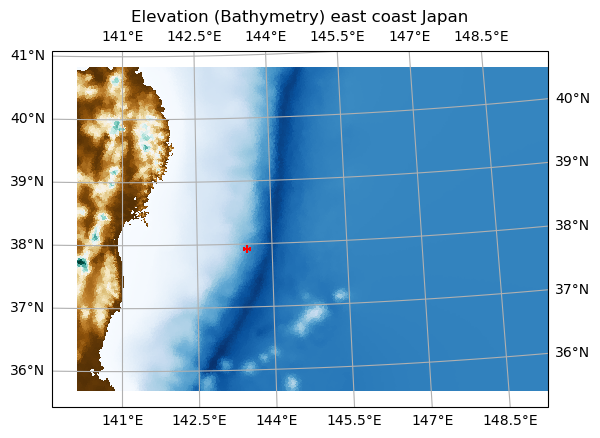

In [19]:
import cartopy
import cartopy.crs as ccrs

fig = plt.figure()
ax = fig.add_subplot(111, projection=ccrs.UTM(zone=54))
#ax = fig.add_subplot(111)

#ax.coastlines()

xll = domain.geo_reference.xllcorner
yll = domain.geo_reference.yllcorner


md = 0.01

# Dry areas
dplotter.triang.set_mask(dplotter.depth > md)
ax.tripcolor(dplotter.triang,
                      facecolors=dplotter.elev,
                      cmap='BrBG')
                      #cmap='viridis_r')
                      #cmap='Greys_r')

# Wet Areas
dplotter.triang.set_mask(dplotter.depth <= md)
ax.tripcolor(dplotter.triang,
                      facecolors=dplotter.elev,
                      cmap='Blues_r')
                      #cmap='viridis')
                      #vmin=vmin, vmax=vmax)

dplotter.triang.set_mask(None)

ax.scatter(x0+xll, y0+yll,marker='+', color='r')



#ax.set_extent([450000,900000,4000000, 4400000], crs=ccrs.UTM(zone=54))
gridlines = ax.gridlines(draw_labels=True)

#ax.coastlines()

plt.title('Elevation (Bathymetry) east coast Japan')

#plt.colorbar()



### Calculate Okada deformation using KL slip field 

Calculate surface deformation based on a simple rectangular fault

Figure files for each frame will be stored in _plot


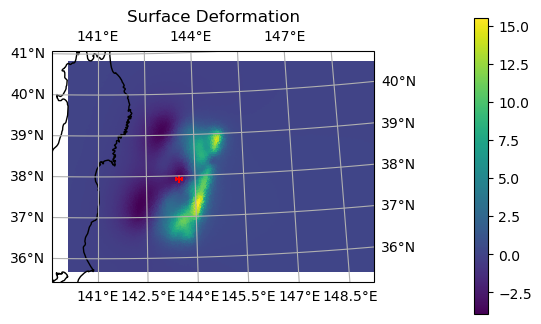

In [20]:
import okada

x = domain.centroid_coordinates[:,0]
y = domain.centroid_coordinates[:,1]

uE,uN,uZ, _ = okl.kl_deformation(x, y, xoff=x0, yoff=y0, E_subfault=10, N_subfault=10, **parameters)

# Plot the deformation
dplotter = anuga.Domain_plotter(domain, absolute=True)

fig = plt.figure()
ax = fig.add_subplot(111, projection=ccrs.UTM(zone=54))
#ax = fig.add_subplot(111)

md = 0.01
#dplotter.triang.set_mask(None)

# dry areas
#dplotter.triang.set_mask(dplotter.depth > md)
img = ax.tripcolor(dplotter.triang,
                      facecolors=uZ,
                      #cmap='BrBG')
                      cmap='viridis')
                      #cmap='Greys_r')


ax.scatter(x0+xll, y0+yll,marker='+', color='r')                      

#ax.set_extent([450000,900000,4000000, 4400000], crs=ccrs.UTM(zone=54))
gridlines = ax.gridlines(draw_labels=True)

plt.colorbar(img, pad = 0.2, shrink=0.8)
ax.coastlines()

plt.title('Surface Deformation');



### Apply deformation to Stage and Elevation

Stage extent      1612.3264338944925 -0.45
uZ extent         15.489617067728464 -3.917693703425574
Stage extent      1612.2771052558667 -4.367693703425574
Elevation extent  1612.2771052558667 -7944.845708071836
Depth extent      7944.269829134786 0.0
Figure files for each frame will be stored in _plot


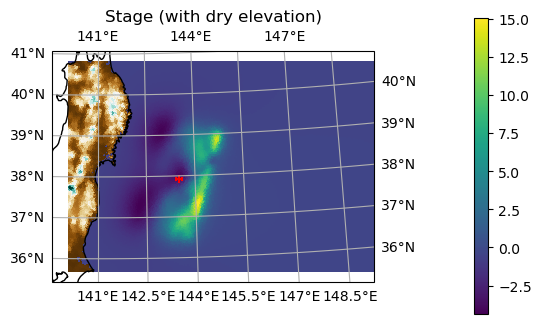

In [21]:
Elevation = domain.quantities['elevation'].centroid_values
Stage     = domain.quantities['stage'].centroid_values

print ('Stage extent     ',np.max(dplotter.stage), np.min(dplotter.stage))

Elevation[:] = Elevation + uZ
Stage[:]     = Stage + uZ

print ('uZ extent        ',np.max(uZ), np.min(uZ))

print ('Stage extent     ',np.max(dplotter.stage), np.min(dplotter.stage))
print ('Elevation extent ',np.max(dplotter.elev), np.min(dplotter.elev))
print ('Depth extent     ',np.max(dplotter.depth), np.min(dplotter.depth))

# plt the updated elevation and stage
dplotter = anuga.Domain_plotter(domain, absolute=True)

fig = plt.figure()
ax = fig.add_subplot(111, projection=ccrs.UTM(zone=54))
#ax = fig.add_subplot(111)

md = 0.01

# dry areas
dplotter.triang.set_mask(dplotter.depth > md)
ax.tripcolor(dplotter.triang,
                      facecolors=dplotter.elev,
                      cmap='BrBG')
                      #cmap='viridis_r')
                      #cmap='Greys_r')


# wet areas
dplotter.triang.set_mask(dplotter.depth <= md)
img = ax.tripcolor(dplotter.triang,
                      facecolors=dplotter.stage,
                      #cmap='Blues_r')
                      cmap='viridis')
                      #vmin=vmin, vmax=vmax)

ax.set_aspect('equal', adjustable='box')

plt.colorbar(img, pad = 0.2, shrink=0.8)

ax.scatter(300000.0+xll,250000.0+yll,marker='+', color='r')

#ax.set_extent([450000,900000,4000000, 4400000], crs=ccrs.UTM(zone=54))
gridlines = ax.gridlines(draw_labels=True)



ax.coastlines()

plt.title('Stage (with dry elevation)');

### Setup Boundary Conditions

In [22]:
Br = anuga.Reflective_boundary(domain)
Bf = anuga.Flather_external_stage_zero_velocity_boundary(domain,lambda t :tide)
# Boundary conditions
domain.set_boundary({'onshore': Br,
                         'bottom': Bf,
                         'ocean_east': Bf,
                         'top': Bf})

### Evolve the simulation

In [23]:
import time
t0 = time.time()
min = 60
hour = 3600

dplotter = anuga.Domain_plotter(domain, absolute=True)

# Run the event
for t in domain.evolve(yieldstep=min, finaltime=2*hour):
    dplotter.save_stage_frame(vmin=-4.0,vmax=12.0)

    domain.print_timestepping_statistics()

print ('That took %.2f seconds' %(time.time()-t0))


Figure files for each frame will be stored in _plot


/home/steve/anuga_core/anuga/shallow_water/boundaries.py:1165: RuntimeWarning: invalid value encountered in divide
  (n2 * Xmom.boundary_values[ids] - n1 * Ymom.boundary_values[ids])/depth_inside,
/home/steve/anuga_core/anuga/shallow_water/boundaries.py:1168: RuntimeWarning: invalid value encountered in divide
  w3 = ndotq_inside/depth_inside + sqrt_g_on_depth_inside*Stage.boundary_values[ids]


Time = 0.0000 (sec), steps=0 (158s)
Time = 60.0000 (sec), delta t in [1.73371019, 1.73371078] (s), steps=35 (2s)
Time = 120.0000 (sec), delta t in [1.73370963, 1.73371018] (s), steps=35 (2s)
Time = 180.0000 (sec), delta t in [1.73370903, 1.73370962] (s), steps=35 (2s)
Time = 240.0000 (sec), delta t in [1.73370572, 1.73370901] (s), steps=35 (2s)
Time = 300.0000 (sec), delta t in [1.73370489, 1.73370568] (s), steps=35 (2s)
Time = 360.0000 (sec), delta t in [1.73370461, 1.73370488] (s), steps=35 (2s)
Time = 420.0000 (sec), delta t in [1.73370443, 1.73370461] (s), steps=35 (2s)
Time = 480.0000 (sec), delta t in [1.73370431, 1.73370443] (s), steps=35 (2s)
Time = 540.0000 (sec), delta t in [1.73370424, 1.73370431] (s), steps=35 (2s)
Time = 600.0000 (sec), delta t in [1.73370424, 1.73370425] (s), steps=35 (2s)
Time = 660.0000 (sec), delta t in [1.73370423, 1.73370426] (s), steps=35 (2s)
Time = 720.0000 (sec), delta t in [1.73370427, 1.73370434] (s), steps=35 (2s)
Time = 780.0000 (sec), delta 

In [24]:
dplotter.make_stage_animation()

--- Logging error ---
Traceback (most recent call last):
  File "/home/steve/miniforge3/envs/anuga_env_39/lib/python3.9/logging/__init__.py", line 434, in format
    return self._format(record)
  File "/home/steve/miniforge3/envs/anuga_env_39/lib/python3.9/logging/__init__.py", line 430, in _format
    return self._fmt % record.__dict__
KeyError: 'mname'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/steve/miniforge3/envs/anuga_env_39/lib/python3.9/logging/__init__.py", line 1083, in emit
    msg = self.format(record)
  File "/home/steve/miniforge3/envs/anuga_env_39/lib/python3.9/logging/__init__.py", line 927, in format
    return fmt.format(record)
  File "/home/steve/miniforge3/envs/anuga_env_39/lib/python3.9/logging/__init__.py", line 666, in format
    s = self.formatMessage(record)
  File "/home/steve/miniforge3/envs/anuga_env_39/lib/python3.9/logging/__init__.py", line 635, in formatMessage
    return self._